# Exploratory Data Analysis (EDA)

L'Exploratory Data Analysis (EDA) est une étape importante du processus de Data Science. L'EDA est une approche de l'analyse des données qui consiste à utiliser des techniques statistiques et des

_**Objectif**- : comprendre les données, identifier les problèmes et optimiser la sélection des caractéristiques audio pour construire un modèle de classification d'audio performant.
- analyser les données pour comprendre leurs caractéristiques, déterminer les relations entre les variables et identifier les tendances et les anomalies.
- Mieux comprendre les données audio, d'identifier les éventuels problèmes et d'optimiser la sélection des caractéristiques audio pour construire un modèle de classification d'audio performant.

 ## Set Up Google Drive

In [ ]:
SET_UP_GOOGLE_DRIVE = True

if SET_UP_GOOGLE_DRIVE:
    from google.colab import drive

    drive.mount('/content/gdrive')

    PROJECT_PATH = "/content/gdrive/Shareddrives/PFE - ING3 Mlamali/DrumClassifier - Project"
    import sys

    sys.path.append(PROJECT_PATH)

Drive already mounted at /content/gdrive; to attempt to forcibly remount, call drive.mount("/content/gdrive", force_remount=True).


## Imports

In [ ]:

import numpy as np
from scipy.stats import skew
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import scipy

# change style
plt.style.use('ggplot')
PLT_STYLE_COLORS = plt.rcParams['axes.prop_cycle'].by_key()['color']
import librosa
import librosa.display
from tqdm import tqdm
from tools import *

tqdm.pandas()
import os
from glob import glob
import random
from datetime import datetime

from typing import List, Tuple, Dict, Union

from concurrent.futures import ThreadPoolExecutor, as_completed

In [ ]:
from params import SOUNDS_DATASET_PATH, SAMPLE_RATE, CLASS_COLORS

if SET_UP_GOOGLE_DRIVE:
    SOUNDS_DATASET_PATH = "/content/gdrive/Shareddrives/PFE - ING3 Mlamali/DrumClassifier - Sounds Dataset"
SOUNDS_DATASET_PATH

'/content/gdrive/Shareddrives/PFE - ING3 Mlamali/DrumClassifier - Sounds Dataset'

## Dataset

description

### Load

In [ ]:
CLASS_NAMES_GROUP: List[list] = [["Kick", "Tom", "808"],
                                 ["Ride (Cymbal)", "Crash (Cymbal)", "Hat Closed (Cymbal)", "Hat Open (Cymbal)"],
                                 ["Clap", "Snap", "Snare","Conga"], [ "Bell", "Metal", "Shaker"]]


def flatten(l):
    return [item for sublist in l for item in sublist]


# todo ajouter tout ça à params py
sort_order = flatten(CLASS_NAMES_GROUP)
sort_order

['Kick',
 'Tom',
 '808',
 'Ride (Cymbal)',
 'Crash (Cymbal)',
 'Hat Closed (Cymbal)',
 'Hat Open (Cymbal)',
 'Clap',
 'Snap',
 'Snare',
 'Conga',
 'Bell',
 'Metal',
 'Shaker']

In [ ]:
now_day_str = "20230511"
df_drums = pd.read_csv(os.path.join(SOUNDS_DATASET_PATH.replace("\\", "/"), f'dataset_features_cleaned_{now_day_str}.csv'))
#todo : dataset_features_cleaned_
df_drums.set_index('file_path', inplace=True)


def flatten(l):
    return [item for sublist in l for item in sublist]


# Trier le dataframe selon la colonne "Class" en utilisant l'ordre de tri spécifié
df_drums['__class'] = pd.Categorical(df_drums['class'], categories=sort_order, ordered=True) # todo generate dataset
df_drums = df_drums.sort_values(by=['__class', "file_name"])
df_drums.drop(['__class'], axis=1, inplace=True)

print(f"Dataset shape: {df_drums.shape}")
df_drums.head()

Dataset shape: (9441, 102)


,file_name,file_extension,class,split,duration,rms_log_sum,rms_log_mean,rms_log_max,rms_log_std,rms_log_diff_abs_mean,...,spec_bw_mean,spec_bw_std,spec_flatness_mean,spec_flatness_std,spec_rolloff_85_mean,spec_rolloff_85_std,spec_rolloff_15_mean,spec_rolloff_15_std,spec_contrast_mean,spec_contrast_std
file_path,,,,,,,,,,,,,,,,,,,,,
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Kick\Almighty Kick [CraddyMusic].wav,Almighty Kick [CraddyMusic],.wav,Kick,train,1.718753,-815.646400,-5.474137,-0.315035,1.542840,0.039382,...,66.760497,446.912802,0.885944,0.317821,76.305579,582.807748,6.358798,20.798566,9.690083,2.764552
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Kick\Basic Kick.wav,Basic Kick,.wav,Kick,test,0.466122,-143.823680,-3.507895,-0.203399,1.873567,0.163677,...,6040.415139,2628.972936,0.120724,0.157800,15109.480993,9041.375768,1632.321837,1211.708854,13.097692,4.937484
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Kick\Best (Kick).wav,Best (Kick),.wav,Kick,train,1.750000,-639.160500,-4.232851,-0.193866,1.077849,0.054044,...,5234.423975,1497.614684,0.141212,0.075214,17804.536489,6518.399589,7325.852390,4439.359665,12.800571,4.841606
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Kick\Demon_Kick.wav,Demon_Kick,.wav,Kick,train,8.000000,-3611.800500,-5.234494,-0.581696,0.567349,0.015392,...,5763.021065,620.968026,0.430654,0.058395,16889.739513,2216.930237,2993.801800,423.945173,14.293943,9.406386
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Kick\Dope Kick.wav,Dope Kick,.wav,Kick,train,0.244762,-55.200016,-2.509092,-0.176139,1.624756,0.240633,...,5035.442166,3342.453843,0.013908,0.032529,10886.012962,9016.857102,111.581143,354.459640,13.789824,4.959522


### Columns

In [ ]:
print(f'Nombre de colonnes: {len(df_drums.columns)}')
df_drums.columns

Nombre de colonnes: 102


Index(['file_name', 'file_extension', 'class', 'split', 'duration',
       'rms_log_sum', 'rms_log_mean', 'rms_log_max', 'rms_log_std',
       'rms_log_diff_abs_mean',
       ...
       'spec_bw_mean', 'spec_bw_std', 'spec_flatness_mean',
       'spec_flatness_std', 'spec_rolloff_85_mean', 'spec_rolloff_85_std',
       'spec_rolloff_15_mean', 'spec_rolloff_15_std', 'spec_contrast_mean',
       'spec_contrast_std'],
      dtype='object', length=102)

#### Columns by prefix

In [ ]:
columns_by_prefix = get_columns_by_prefix_(df_drums.columns)
columns_by_prefix

{'duration': ['duration'],
 'split': ['split'],
 'zcr': ['zcr_sum', 'zcr_mean', 'zcr_std', 'zcr_loudest_frame'],
 'temp': ['temp_cent'],
 'attack': ['attack_time'],
 'class': ['class'],
 'pitch': ['pitch'],
 'spec': ['spec_cent_mean',
  'spec_cent_std',
  'spec_bw_mean',
  'spec_bw_std',
  'spec_flatness_mean',
  'spec_flatness_std',
  'spec_rolloff_85_mean',
  'spec_rolloff_85_std',
  'spec_rolloff_15_mean',
  'spec_rolloff_15_std',
  'spec_contrast_mean',
  'spec_contrast_std'],
 'mfcc': ['mfcc_mean_1',
  'mfcc_mean_2',
  'mfcc_mean_3',
  'mfcc_mean_4',
  'mfcc_mean_5',
  'mfcc_mean_6',
  'mfcc_mean_7',
  'mfcc_mean_8',
  'mfcc_mean_9',
  'mfcc_mean_10',
  'mfcc_mean_11',
  'mfcc_mean_12',
  'mfcc_std_1',
  'mfcc_std_2',
  'mfcc_std_3',
  'mfcc_std_4',
  'mfcc_std_5',
  'mfcc_std_6',
  'mfcc_std_7',
  'mfcc_std_8',
  'mfcc_std_9',
  'mfcc_std_10',
  'mfcc_std_11',
  'mfcc_std_12',
  'mfcc_max_1',
  'mfcc_max_2',
  'mfcc_max_3',
  'mfcc_max_4',
  'mfcc_max_5',
  'mfcc_max_6',
  'mfcc_

In [ ]:
get_columns_starts_with(df_drums.columns, "spec_bw")

['spec_bw_mean', 'spec_bw_std']

In [ ]:
def get_columns_by_suffix(columns_list: list) -> dict:
    """
    Récupère les colonnes par suffixe à partir d'une liste de colonnes.
    
    Args:
        columns_list (list): Liste de colonnes.
    
    Returns:
        dict: Dictionnaire contenant les suffixes comme clés et les colonnes associées comme valeurs.
    """
    suffixes = set([col.split('_')[-1] for col in columns_list])
    columns_by_suffix = {}
    for suffix in suffixes:
        columns_by_suffix[suffix] = [col for col in columns_list if col.endswith(suffix)]
    return columns_by_suffix


columns_by_suffix = get_columns_by_suffix(df_drums.columns)

columns_by_suffix

{'1': ['mfcc_mean_1',
  'mfcc_mean_11',
  'mfcc_std_1',
  'mfcc_std_11',
  'mfcc_max_1',
  'mfcc_max_11',
  'mfcc_min_1',
  'mfcc_min_11',
  'mfcc_skew_1',
  'mfcc_skew_11',
  'mfcc_kurtosis_1',
  'mfcc_kurtosis_11'],
 '4': ['mfcc_mean_4',
  'mfcc_std_4',
  'mfcc_max_4',
  'mfcc_min_4',
  'mfcc_skew_4',
  'mfcc_kurtosis_4'],
 '6': ['mfcc_mean_6',
  'mfcc_std_6',
  'mfcc_max_6',
  'mfcc_min_6',
  'mfcc_skew_6',
  'mfcc_kurtosis_6'],
 'pitch': ['pitch'],
 '12': ['mfcc_mean_12',
  'mfcc_std_12',
  'mfcc_max_12',
  'mfcc_min_12',
  'mfcc_skew_12',
  'mfcc_kurtosis_12'],
 '11': ['mfcc_mean_11',
  'mfcc_std_11',
  'mfcc_max_11',
  'mfcc_min_11',
  'mfcc_skew_11',
  'mfcc_kurtosis_11'],
 '7': ['mfcc_mean_7',
  'mfcc_std_7',
  'mfcc_max_7',
  'mfcc_min_7',
  'mfcc_skew_7',
  'mfcc_kurtosis_7'],
 'cent': ['temp_cent'],
 '8': ['mfcc_mean_8',
  'mfcc_std_8',
  'mfcc_max_8',
  'mfcc_min_8',
  'mfcc_skew_8',
  'mfcc_kurtosis_8'],
 'name': ['file_name'],
 '2': ['mfcc_mean_2',
  'mfcc_mean_12',
  'mf

#### Features columns

In [ ]:
# get columns names with float type use .info()
features_columns = [k for k, v in df_drums.dtypes.to_dict().items() if v == 'float64' or v == 'int64']
print(f"Nombre de features: {len(features_columns)}")

Nombre de features: 98


In [ ]:
not_features_columns= df_drums.columns[~df_drums.columns.isin(features_columns)].tolist()
not_features_columns

['file_name', 'file_extension', 'class', 'split']

In [ ]:
df_drums[features_columns].head()

,duration,rms_log_sum,rms_log_mean,rms_log_max,rms_log_std,rms_log_diff_abs_mean,rms_log_crest_factor,zcr_sum,zcr_mean,zcr_std,...,spec_bw_mean,spec_bw_std,spec_flatness_mean,spec_flatness_std,spec_rolloff_85_mean,spec_rolloff_85_std,spec_rolloff_15_mean,spec_rolloff_15_std,spec_contrast_mean,spec_contrast_std
file_path,,,,,,,,,,,,,,,,,,,,,
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Kick\Almighty Kick [CraddyMusic].wav,1.718753,-815.646400,-5.474137,-0.315035,1.542840,0.039382,5.159102,0.074219,0.000498,0.001729,...,66.760497,446.912802,0.885944,0.317821,76.305579,582.807748,6.358798,20.798566,9.690083,2.764552
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Kick\Basic Kick.wav,0.466122,-143.823680,-3.507895,-0.203399,1.873567,0.163677,3.304495,19.022461,0.463962,0.312691,...,6040.415139,2628.972936,0.120724,0.157800,15109.480993,9041.375768,1632.321837,1211.708854,13.097692,4.937484
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Kick\Best (Kick).wav,1.750000,-639.160500,-4.232851,-0.193866,1.077849,0.054044,4.038985,84.785156,0.561491,0.308251,...,5234.423975,1497.614684,0.141212,0.075214,17804.536489,6518.399589,7325.852390,4439.359665,12.800571,4.841606
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Kick\Demon_Kick.wav,8.000000,-3611.800500,-5.234494,-0.581696,0.567349,0.015392,4.652798,317.313477,0.459875,0.059096,...,5763.021065,620.968026,0.430654,0.058395,16889.739513,2216.930237,2993.801800,423.945173,14.293943,9.406386
G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Kick\Dope Kick.wav,0.244762,-55.200016,-2.509092,-0.176139,1.624756,0.240633,2.332953,0.715820,0.032537,0.082541,...,5035.442166,3342.453843,0.013908,0.032529,10886.012962,9016.857102,111.581143,354.459640,13.789824,4.959522


### Overview

In [ ]:
df_drums.info(verbose=True, show_counts=True)

<class 'pandas.core.frame.DataFrame'>
Index: 9441 entries, G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Kick\Almighty Kick [CraddyMusic].wav to G:\Shared drives\PFE - ING3 Mlamali\DrumClassifier - Sounds Dataset\Shaker\shaker3.wav
Data columns (total 102 columns):
 #    Column                 Non-Null Count  Dtype  
---   ------                 --------------  -----  
 0    file_name              9441 non-null   object 
 1    file_extension         9441 non-null   object 
 2    class                  9441 non-null   object 
 3    split                  9441 non-null   object 
 4    duration               9441 non-null   float64
 5    rms_log_sum            9441 non-null   float64
 6    rms_log_mean           9441 non-null   float64
 7    rms_log_max            9441 non-null   float64
 8    rms_log_std            9441 non-null   float64
 9    rms_log_diff_abs_mean  9441 non-null   float64
 10   rms_log_crest_factor   9441 non-null   float64
 11   zcr_sum          

#### Describe statistics

In [ ]:
df_drums.describe().T

,count,mean,std,min,25%,50%,75%,max
duration,9441.0,1.461909,2.289942,0.046440,0.290113,0.586349,1.612993,32.443175
rms_log_sum,9441.0,-324.251941,707.754582,-19702.312000,-292.608830,-97.892010,-37.788418,19.588580
rms_log_mean,9441.0,-2.056712,1.046596,-16.223179,-2.651759,-1.919283,-1.302748,0.230454
rms_log_max,9441.0,-0.457952,0.281412,-6.000000,-0.605412,-0.452728,-0.247496,0.436995
rms_log_std,9441.0,1.030189,0.562420,0.000000,0.660310,0.924704,1.299505,9.146350
...,...,...,...,...,...,...,...,...
spec_rolloff_85_std,9441.0,2666.669060,2031.331797,0.000000,1009.504231,2217.223626,3958.288398,10482.752616
spec_rolloff_15_mean,9441.0,1261.562323,1579.343903,0.000000,90.439453,637.548453,1848.970638,13330.109579
spec_rolloff_15_std,9441.0,538.805236,791.529989,0.000000,45.391222,253.552870,769.407336,8177.052036
spec_contrast_mean,9441.0,15.673303,2.487893,0.000000,14.143455,15.241089,16.712607,31.094175


## Class distribution

In [ ]:
print(f"{df_drums['class'].nunique()} classes")
class_names = df_drums['class'].unique().tolist()
class_names

14 classes


['Kick',
 'Tom',
 '808',
 'Ride (Cymbal)',
 'Crash (Cymbal)',
 'Hat Closed (Cymbal)',
 'Hat Open (Cymbal)',
 'Clap',
 'Snap',
 'Snare',
 'Conga',
 'Bell',
 'Metal',
 'Shaker']

In [ ]:
df_drums['class'].value_counts()

Kick                   1509
Snare                  1333
Clap                   1242
Tom                     956
808                     720
Hat Closed (Cymbal)     695
Conga                   575
Crash (Cymbal)          528
Metal                   475
Hat Open (Cymbal)       443
Ride (Cymbal)           398
Shaker                  237
Bell                    209
Snap                    121
Name: class, dtype: int64

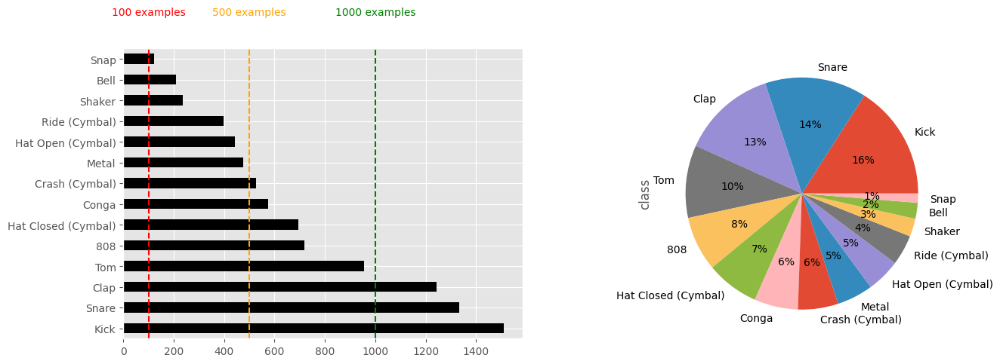

In [ ]:
def plot_class_distribution(df, class_column, figsize=(15, 5), threshold1=100, threshold2=500, threshold3=1000):
    """
    Plot the distribution of class labels in a dataframe.

    Parameters:
        -- df (pandas DataFrame): The input dataframe.
        -- class_column (str): The name of the column containing the class labels.
        -- figsize (tuple, optional): The size of the figure. Default is (15, 5).
        -- threshold1 (int, optional): The threshold for the first vertical line. Default is 100.
        -- threshold2 (int, optional): The threshold for the second vertical line. Default is 500.
        -- threshold3 (int, optional): The threshold for the third vertical line. Default is 1000.
    """

    fig, (ax1, ax2) = plt.subplots(1, 2, figsize=figsize)
    df[class_column].value_counts().plot(kind='barh', ax=ax1, color='black')
    df[class_column].value_counts().plot(kind='pie', ax=ax2, autopct='%.0f%%')

    # vertical lines and text annotations
    ax1.axvline(threshold1, color='r', linestyle='--')
    ax1.text(threshold1, 15, f"{threshold1} examples", fontsize=10, va="bottom", ha="center", color="r")
    ax1.axvline(threshold2, color='orange', linestyle='--')
    ax1.text(threshold2, 15, f"{threshold2} examples", fontsize=10, va="bottom", ha="center", color="orange")
    ax1.axvline(threshold3, color='g', linestyle='--')
    ax1.text(threshold3, 15, f"{threshold3} examples", fontsize=10, va="bottom", ha="center", color="g")

    plt.show()

plot_class_distribution(df_drums, "class")

## Visualize/play examples


  0%|          | 0/14 [00:00<?, ?it/s]

######################################## Kick ########################################
> Kick/Kick 0545.flac


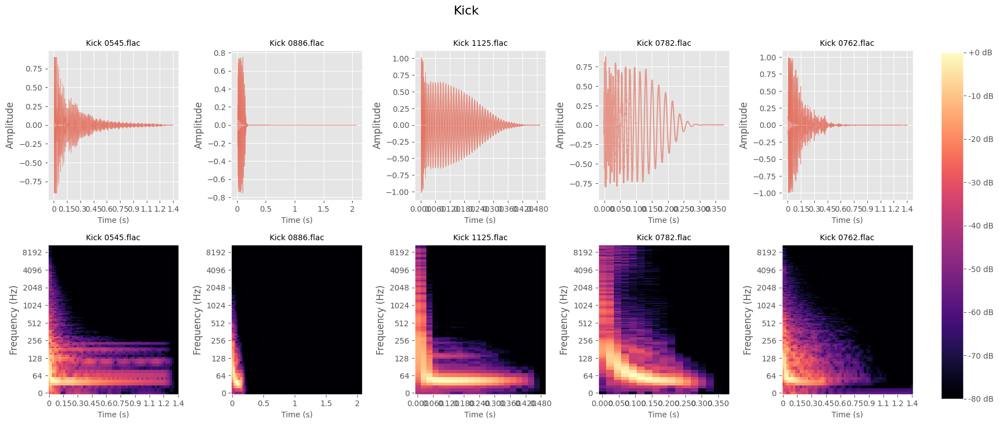

  7%|▋         | 1/14 [01:01<13:19, 61.47s/it]

######################################## Tom ########################################
> Tom/Tom 0982.flac


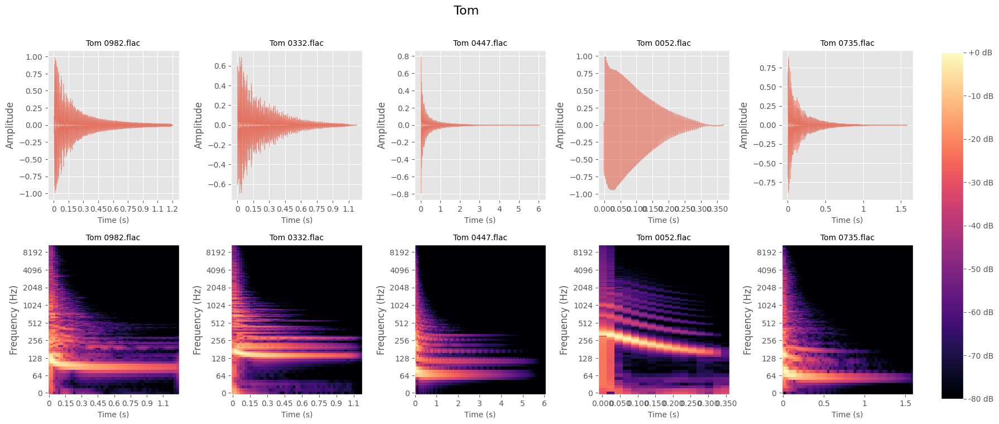

 14%|█▍        | 2/14 [01:26<08:03, 40.30s/it]

######################################## 808 ########################################
> 808/Dead Star 808.wav


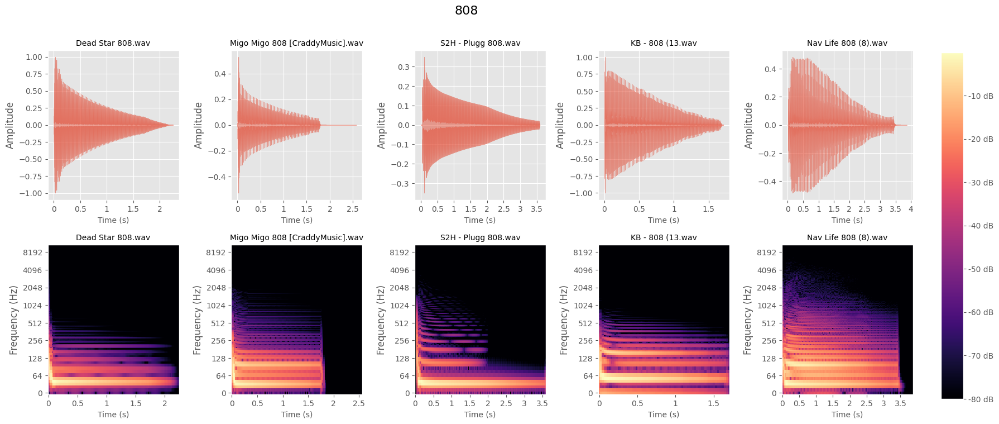

 21%|██▏       | 3/14 [01:59<06:44, 36.82s/it]

######################################## Ride (Cymbal) ########################################
> Ride (Cymbal)/Ride 0014.flac


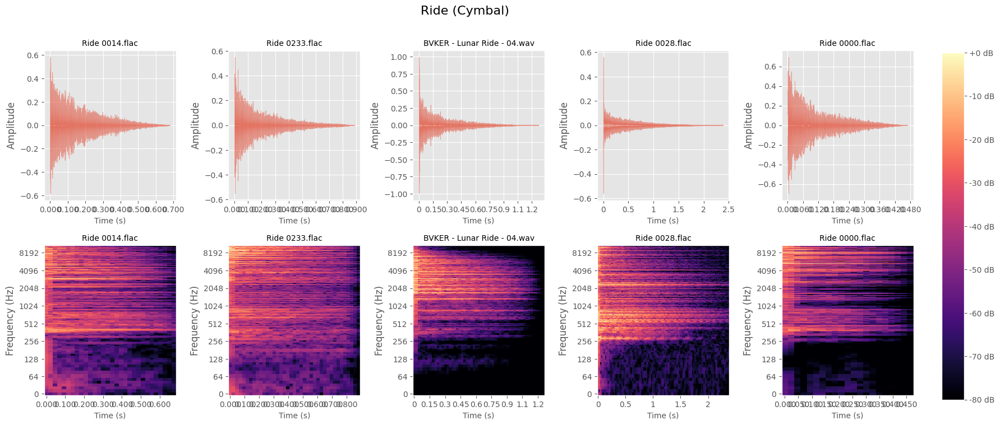

 29%|██▊       | 4/14 [02:18<04:56, 29.65s/it]

######################################## Crash (Cymbal) ########################################
> Crash (Cymbal)/CYMCRAS2.WAV


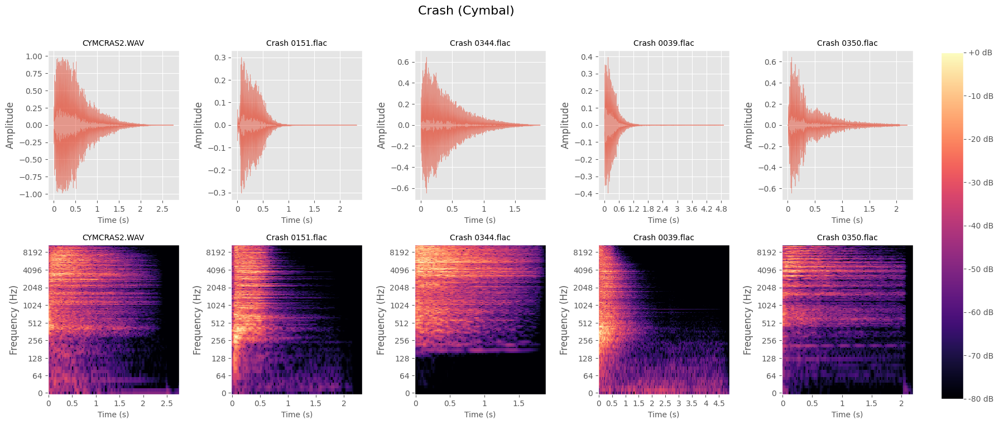

 36%|███▌      | 5/14 [02:37<03:51, 25.71s/it]

######################################## Hat Closed (Cymbal) ########################################
> Hat Closed (Cymbal)/HHatC 0070.flac


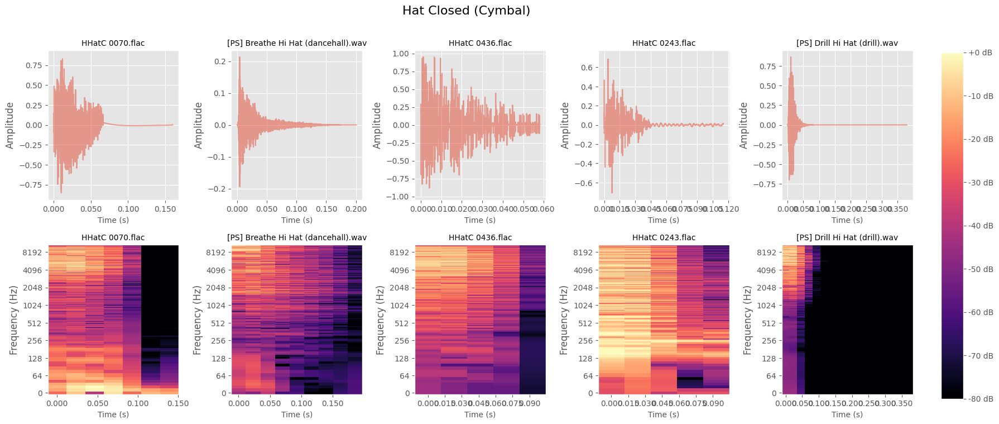

 43%|████▎     | 6/14 [02:52<02:57, 22.24s/it]

######################################## Hat Open (Cymbal) ########################################
> Hat Open (Cymbal)/BVKER - Trap Devil Open Hat 10.wav


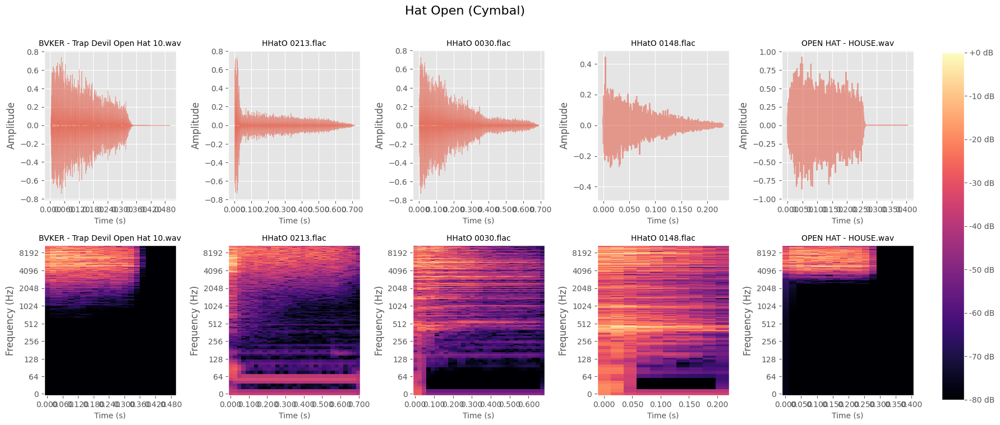

 50%|█████     | 7/14 [03:10<02:26, 20.92s/it]

######################################## Clap ########################################
> Clap/Clap 0191.flac


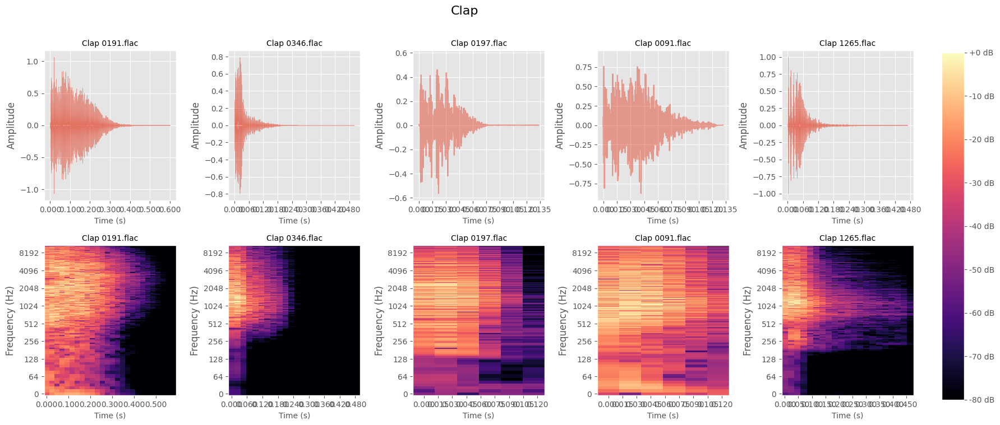

 57%|█████▋    | 8/14 [03:30<02:03, 20.61s/it]

######################################## Snap ########################################
> Snap/CNN - Snap 05.wav


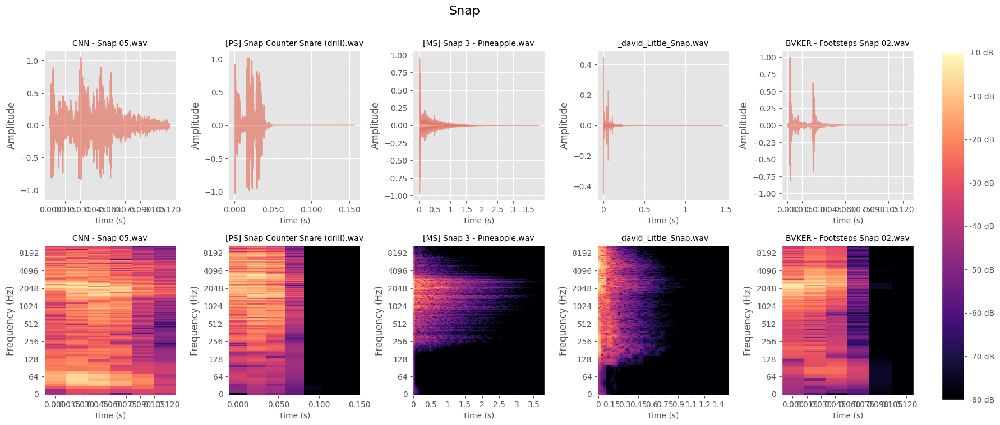

 64%|██████▍   | 9/14 [03:47<01:36, 19.33s/it]

######################################## Snare ########################################
> Snare/Snare 0729.flac


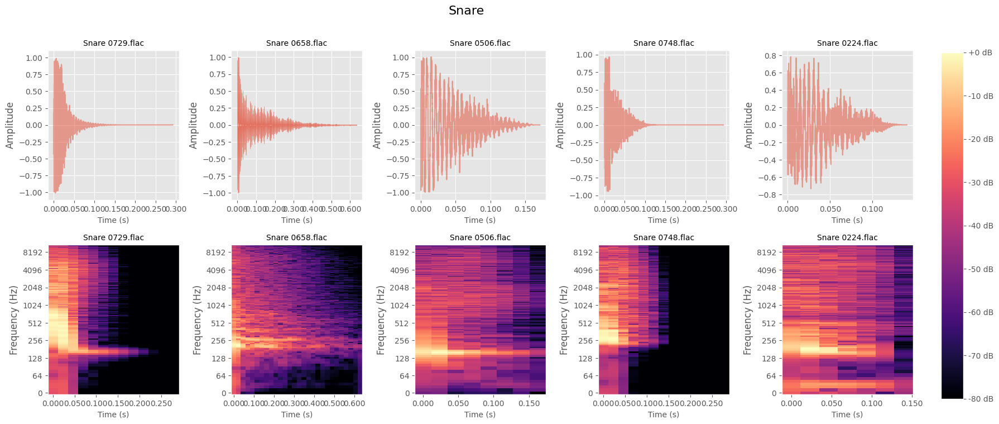

 71%|███████▏  | 10/14 [04:06<01:17, 19.32s/it]

######################################## Conga ########################################
> Conga/KAMAL - Conga (1).wav


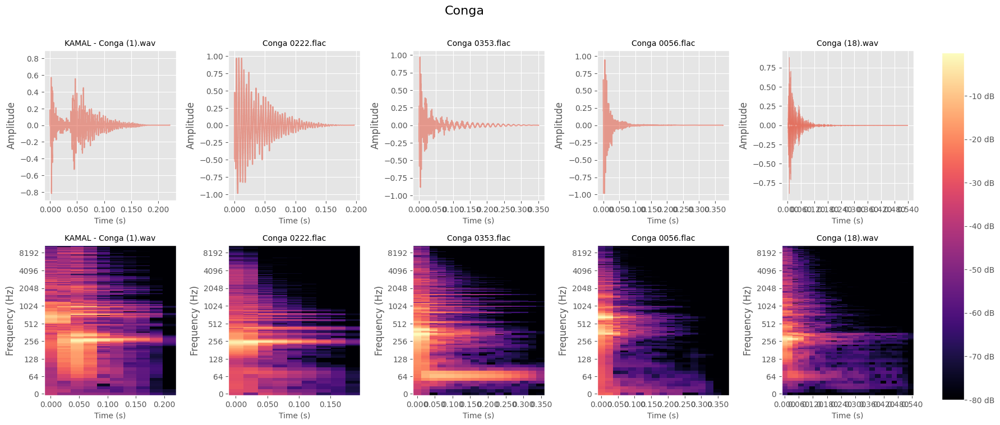

 79%|███████▊  | 11/14 [04:19<00:52, 17.47s/it]

######################################## Bell ########################################
> Bell/Real Bell 20.wav


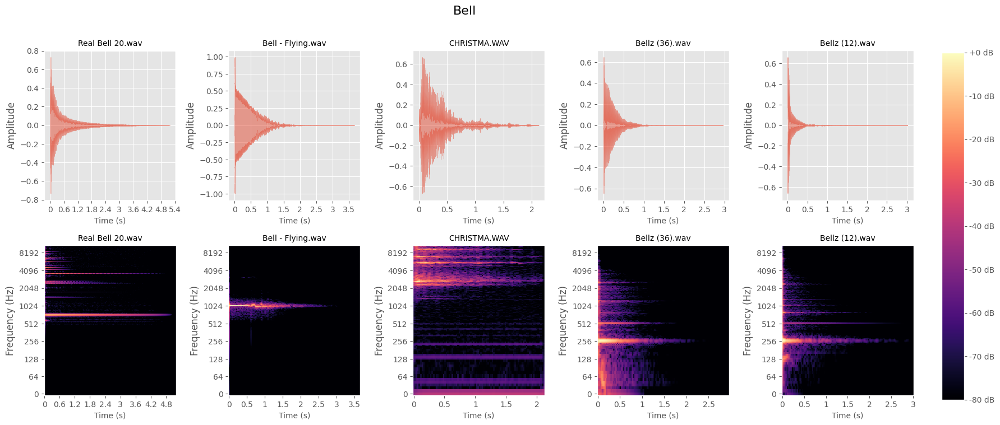

 86%|████████▌ | 12/14 [04:37<00:34, 17.42s/it]

######################################## Metal ########################################
> Metal/Drill Triangle v4 (4).wav


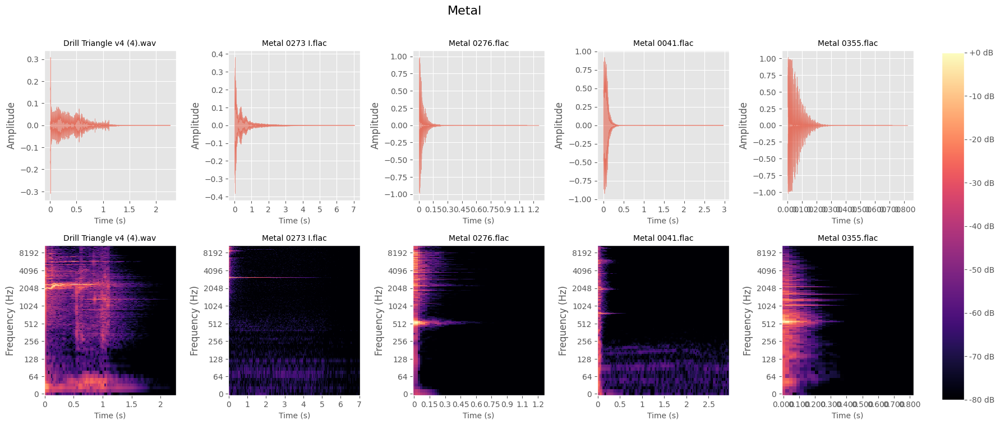

 93%|█████████▎| 13/14 [04:54<00:17, 17.46s/it]

######################################## Shaker ########################################
> Shaker/Vb_Shk8.wav


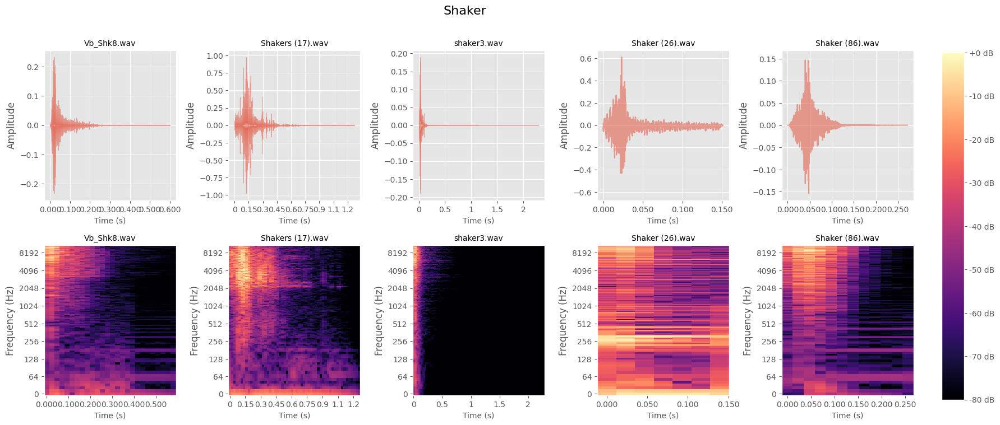

100%|██████████| 14/14 [05:09<00:00, 22.08s/it]


In [ ]:
def plot_audio_signals(audio_files, n_fft=2048, hop_length=512, figsize=(20, 8), title=None, play=False):
    """
    Affiche les tracés du domaine temporel et du domaine fréquentiel d'une liste d'audios.

    Args:
        audio_files (list): Liste des chemins des fichiers audio à visualiser (maximum 5).
        n_fft (int): Taille de la fenêtre de transformation de Fourier.
        hop_length (int): Pas de la fenêtre de transformation de Fourier.
        figsize (tuple): Taille de la figure (largeur, hauteur).
        title (str): Titre de la figure.
    """
    if len(audio_files) > 5:
        raise ValueError("Le nombre maximum d'audios pris en charge est de 5.")

    if SET_UP_GOOGLE_DRIVE:
        audio_files = [SOUNDS_DATASET_PATH + "/" + "/".join(audio_file.split("\\")[-2:]) for audio_file in audio_files]

    if play:
        for audio_file in audio_files:
            play_audio(audio_file)

    fig, axes = plt.subplots(nrows=2, ncols=len(audio_files), figsize=figsize)
    cbar_ax = fig.add_axes([0.925, 0.1, .02, .775])  # [left, bottom, width, height]

    for i, audio_file in enumerate(audio_files):
        # Chargement du fichier audio
        y, sr = librosa.load(audio_file)
        audio_name = os.path.basename(audio_file)
        # Tracé du domaine temporel
        librosa.display.waveshow(y, alpha=0.5, ax=axes[0, i])
        axes[0, i].set_title(f"{audio_name}", fontsize=10)
        axes[0, i].set_ylabel("Amplitude")
        axes[0, i].set_xlabel("Time (s)", fontsize=10)

        # Tracé du domaine fréquentiel
        length_signal = len(y)
        if length_signal < n_fft:
            # Padding pour que la longueur du signal soit égale à n_fft
            y = np.pad(y, (0, max(0, n_fft - length_signal)), "constant")

        D = librosa.stft(y, n_fft=n_fft, hop_length=hop_length)
        S_db = librosa.amplitude_to_db(abs(D), ref=np.max)
        img = librosa.display.specshow(S_db, sr=sr, x_axis='time', y_axis='log', ax=axes[1, i])
        axes[1, i].set_title(f"{audio_name}", fontsize=10)
        axes[1, i].set_xlabel("Time (s)", fontsize=10)
        axes[1, i].set_ylabel("Frequency (Hz)")
        #axes[1, i].set_yticks([100, 200, 500, 1000, 2000, 5000])
        #axes[1, i].set_yticklabels(['100', '200', '500', '1k', '2k', '5k'])

    # Ajout de la barre de couleur
    plt.colorbar(img, format="%+2.0f dB", ax=axes.ravel().tolist(), cax=cbar_ax)
    plt.subplots_adjust(wspace=0.4, hspace=0.3)
    if title:
        plt.suptitle(title, fontsize=16)
    plt.show()


ok = 1 #todo 
if ok:
    for class_name in tqdm(class_names):
        print("#" * 40, class_name, "#" * 40)

        # get 5 sample random of file path
        file_paths = df_drums[df_drums['class'] == class_name].reset_index().sample(5)['file_path'].tolist()
        plot_audio_signals(file_paths, title=class_name)

## Univariate analysis

L'analyse univariée est une étape cruciale dans l'exploration des données, qui consiste à examiner individuellement chaque variable ou caractéristique du jeu de données. L'objectif de cette analyse est d'obtenir une compréhension de base de la distribution, de la centralité et de la dispersion des valeurs pour chaque variable. Les techniques couramment utilisées pour l'analyse univariée incluent les histogrammes, les boîtes à moustaches et les graphiques en barres. En identifiant les valeurs aberrantes et les tendances dans les données, l'analyse univariée permet de mieux comprendre les caractéristiques individuelles et d'éclairer les prochaines étapes de l'analyse des données.

In [ ]:
columns_by_prefix

{'duration': ['duration'],
 'split': ['split'],
 'zcr': ['zcr_sum', 'zcr_mean', 'zcr_std', 'zcr_loudest_frame'],
 'temp': ['temp_cent'],
 'attack': ['attack_time'],
 'class': ['class'],
 'pitch': ['pitch'],
 'spec': ['spec_cent_mean',
  'spec_cent_std',
  'spec_bw_mean',
  'spec_bw_std',
  'spec_flatness_mean',
  'spec_flatness_std',
  'spec_rolloff_85_mean',
  'spec_rolloff_85_std',
  'spec_rolloff_15_mean',
  'spec_rolloff_15_std',
  'spec_contrast_mean',
  'spec_contrast_std'],
 'mfcc': ['mfcc_mean_1',
  'mfcc_mean_2',
  'mfcc_mean_3',
  'mfcc_mean_4',
  'mfcc_mean_5',
  'mfcc_mean_6',
  'mfcc_mean_7',
  'mfcc_mean_8',
  'mfcc_mean_9',
  'mfcc_mean_10',
  'mfcc_mean_11',
  'mfcc_mean_12',
  'mfcc_std_1',
  'mfcc_std_2',
  'mfcc_std_3',
  'mfcc_std_4',
  'mfcc_std_5',
  'mfcc_std_6',
  'mfcc_std_7',
  'mfcc_std_8',
  'mfcc_std_9',
  'mfcc_std_10',
  'mfcc_std_11',
  'mfcc_std_12',
  'mfcc_max_1',
  'mfcc_max_2',
  'mfcc_max_3',
  'mfcc_max_4',
  'mfcc_max_5',
  'mfcc_max_6',
  'mfcc_

In [ ]:
print(class_names)

['Kick', 'Tom', '808', 'Ride (Cymbal)', 'Crash (Cymbal)', 'Hat Closed (Cymbal)', 'Hat Open (Cymbal)', 'Clap', 'Snap', 'Snare', 'Conga', 'Bell', 'Metal', 'Shaker']


### Audio duration

100%|██████████| 4/4 [00:02<00:00,  1.48it/s]


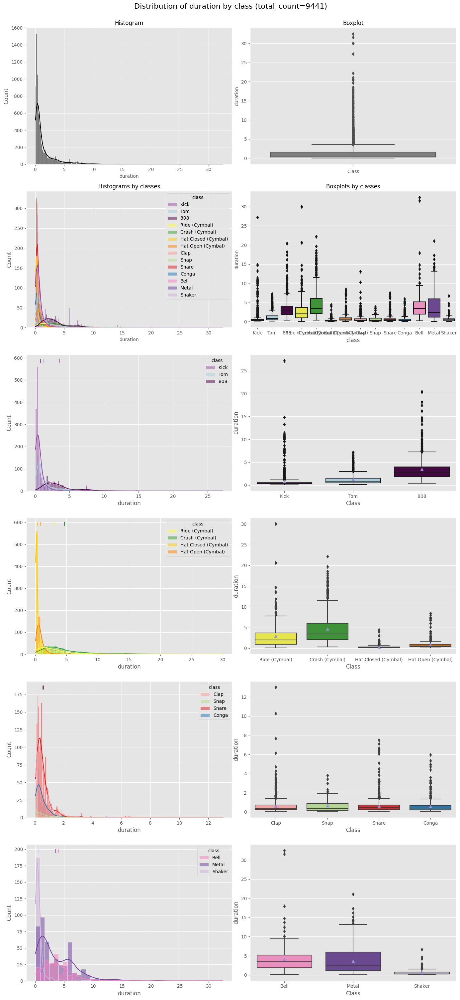

In [34]:
def plot_column_distribution_by_class(df, column_focus, class_names_group_list=CLASS_NAMES_GROUP, hist_alpha=0.5,
                                      figsize_width=7, figsize_height=5):
    """
    Fonction pour tracer les distributions d'une colonne spécifique dans un DataFrame en fonction des classes
    groupées dans une liste de noms de classes.

    Paramètres :
        - df : DataFrame : Le DataFrame contenant les données
        - column_focus : str : La colonne d'intérêt à tracer
        - class_names_group_list : list of lists : Liste de listes de noms de classes, où chaque liste contient les noms de
                                                classes à grouper ensemble dans le tracé
        - n_cols : int : Nombre de colonnes dans la disposition des sous-tracés (par défaut 2)
        - figsize : tuple : La taille de la figure (par défaut (20, 10))

    Retour :
        - None
    """
    if column_focus not in df.columns:
        raise f"{column_focus} no exists."

    
    n_rows = len(class_names_group_list) + 2
    n_cols = 2

    fig, axes = plt.subplots(nrows=n_rows, ncols=n_cols, figsize=(figsize_width * n_cols, figsize_height * n_rows))
    fig.suptitle(f"Distribution of {column_focus} by class (total_count={df.shape[0]})", fontsize=16, y=1.00)

    # plot distribution of all classes
    # hist
    sns.histplot(data=df, x=column_focus, ax=axes[0, 0], kde=True, alpha=hist_alpha, color='black')
    axes[0, 0].set_title(f"Histogram", fontsize=12)
    axes[0, 0].set_xlabel(column_focus, fontsize=10)
    # boxplot
    sns.boxplot(data=df, y=column_focus, ax=axes[0, 1], color='grey')
    axes[0, 1].set_title("Boxplot", fontsize=12)
    axes[0, 1].set_xlabel("Class", fontsize=10)
    axes[0, 1].set_ylabel(column_focus, fontsize=10)

    # plot distribution of all classes
    # hist
    sns.histplot(data=df, x=column_focus, hue='class', ax=axes[1, 0], kde=True, alpha=hist_alpha, palette=CLASS_COLORS)
    axes[1, 0].set_title("Histograms by classes", fontsize=12)
    axes[1, 0].set_xlabel(column_focus, fontsize=10)
    # boxplot
    sns.boxplot(data=df, x='class', y=column_focus, ax=axes[1, 1], palette=CLASS_COLORS)
    axes[1, 1].set_title("Boxplots by classes", fontsize=12)
    #axes[1, 1].set_xlabel("Class", fontsize=10)
    axes[1, 1].set_ylabel(column_focus, fontsize=10)

    #class_names_group_list = class_names_group_list[:1]
    table_means = df.groupby('class')[column_focus].mean()

    for i, cols in tqdm(enumerate(class_names_group_list, start=2), total=len(class_names_group_list)):
        df_class_group = df[df['class'].isin(cols)]
        sns.histplot(data=df_class_group, x=column_focus, hue='class', ax=axes[i, 0], kde=True,
                     alpha=hist_alpha, palette=CLASS_COLORS)
        

        axes[i, 0].set_xlabel(column_focus, fontsize=12)
        axes[i, 0].set_ylabel("Count", fontsize=12)

        y_pos = axes[i, 0].get_ylim()[1]
        # add mean points (on the top hist) of each class (each line change color with default color)
        for j, class_name in enumerate(cols):
            mean = table_means[class_name]

            axes[i, 0].scatter(x=mean, y=y_pos, s=70, color=CLASS_COLORS[class_name], marker='|')
            #axes[i, 0].text(x=mean, y=y_pos * (1.05), s=f"{mean:.2f}", color=PLT_STYLE_COLORS[j], fontsize=10,
            #                horizontalalignment='center', verticalalignment='top')

        # Boxplot
        sns.boxplot(data=df_class_group, x='class', y=column_focus, ax=axes[i, 1], showmeans=True, palette=CLASS_COLORS)
        axes[i, 1].set_xlabel("Class", fontsize=12)
        axes[i, 1].set_ylabel(column_focus, fontsize=12)

    # subplots adjustment
    plt.tight_layout(w_pad=0.2)

    plt.show()


plot_column_distribution_by_class(df=df_drums, column_focus='duration')

### Root mean square energy (Log)

100%|██████████| 4/4 [00:01<00:00,  2.51it/s]


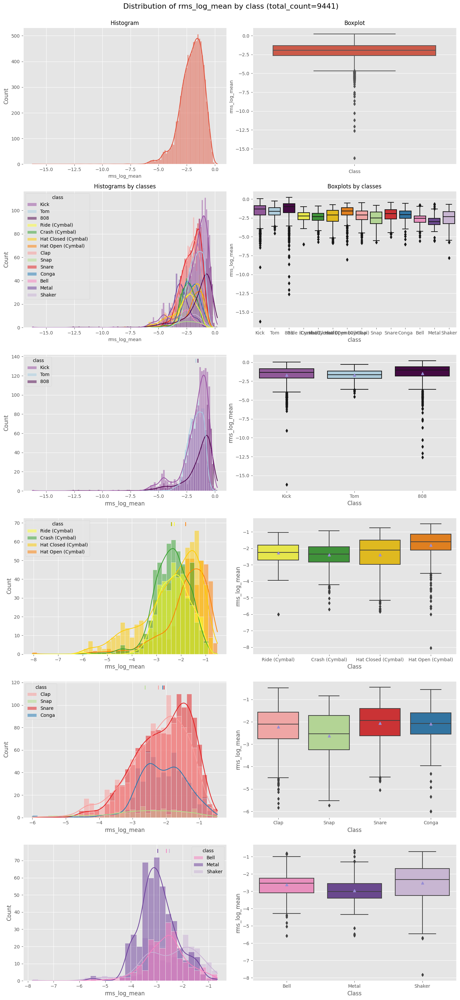

In [ ]:
plot_column_distribution_by_class(df=df_drums, column_focus='rms_log_mean')

100%|██████████| 4/4 [00:03<00:00,  1.28it/s]


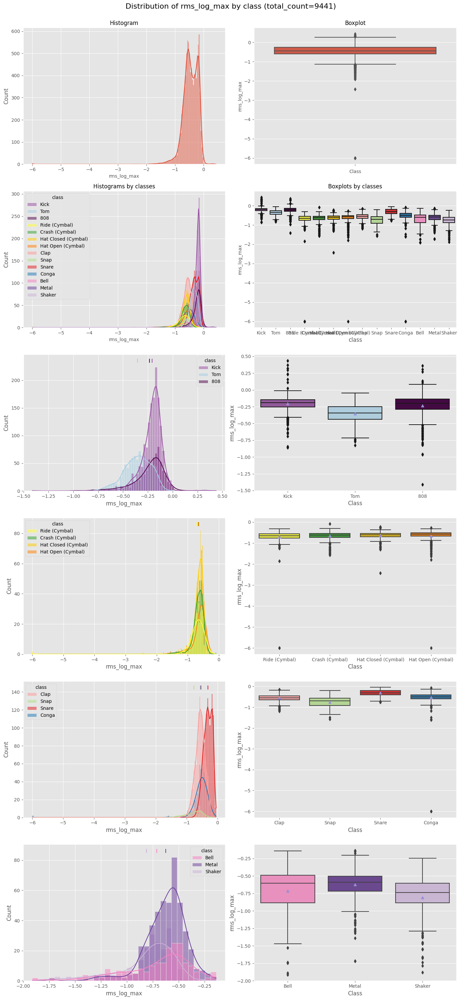

In [ ]:
plot_column_distribution_by_class(df=df_drums, column_focus='rms_log_max')

### Temporal centroid

100%|██████████| 4/4 [00:08<00:00,  2.25s/it]


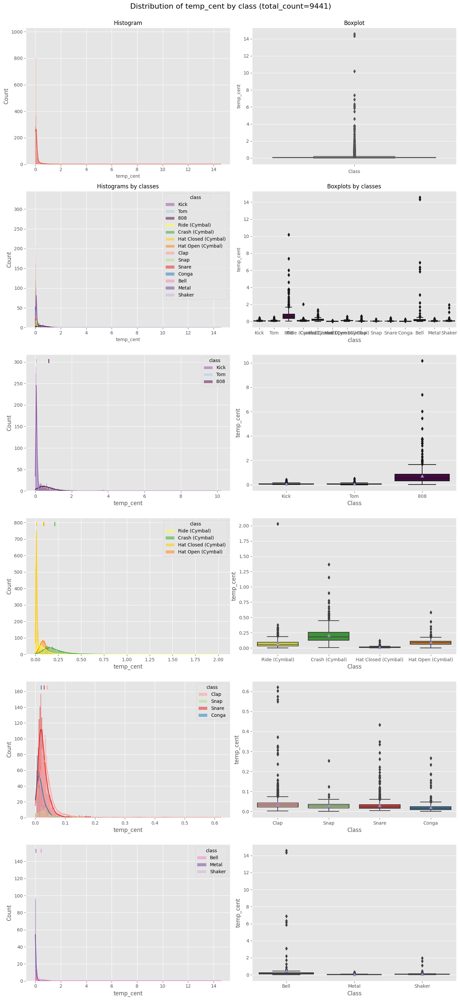

In [ ]:
plot_column_distribution_by_class(df=df_drums, column_focus='temp_cent')

### Zero crossing rate

100%|██████████| 4/4 [00:02<00:00,  1.47it/s]


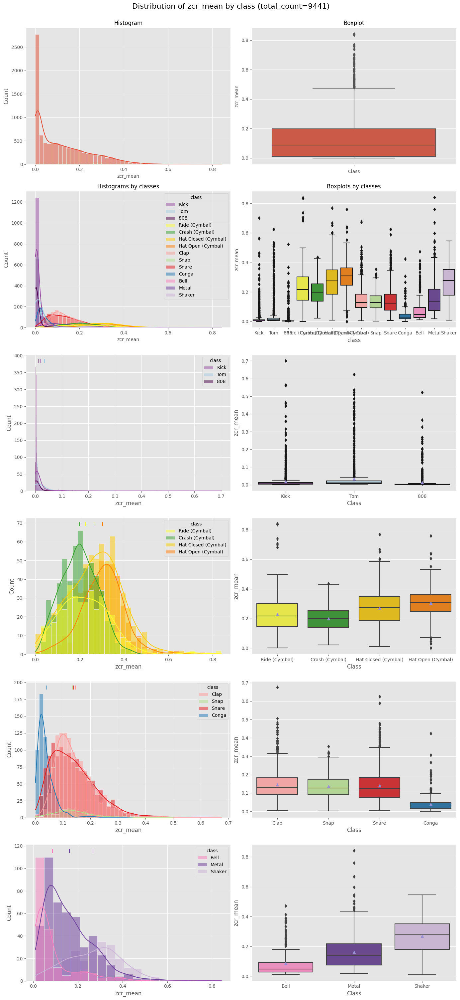

In [ ]:
plot_column_distribution_by_class(df=df_drums, column_focus='zcr_mean')

100%|██████████| 4/4 [00:13<00:00,  3.42s/it]


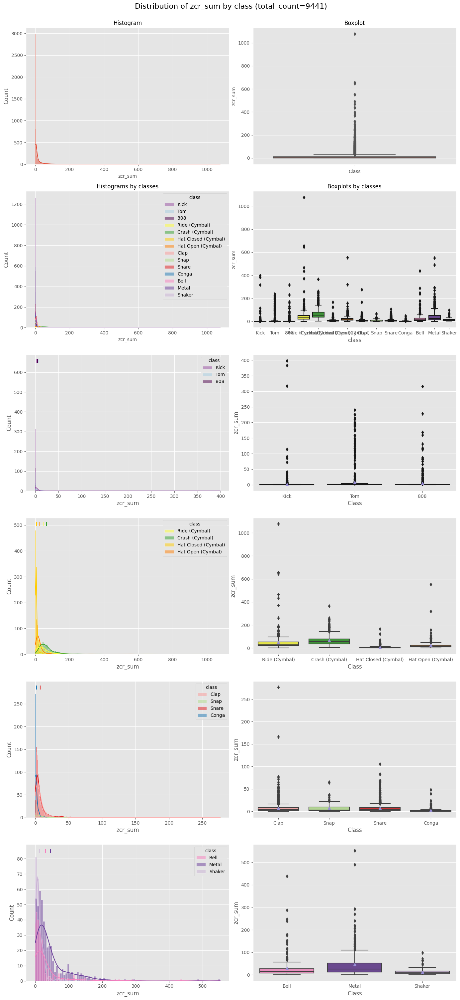

In [ ]:
plot_column_distribution_by_class(df=df_drums, column_focus='zcr_sum')

### Spectral centroid

100%|██████████| 4/4 [00:01<00:00,  2.34it/s]


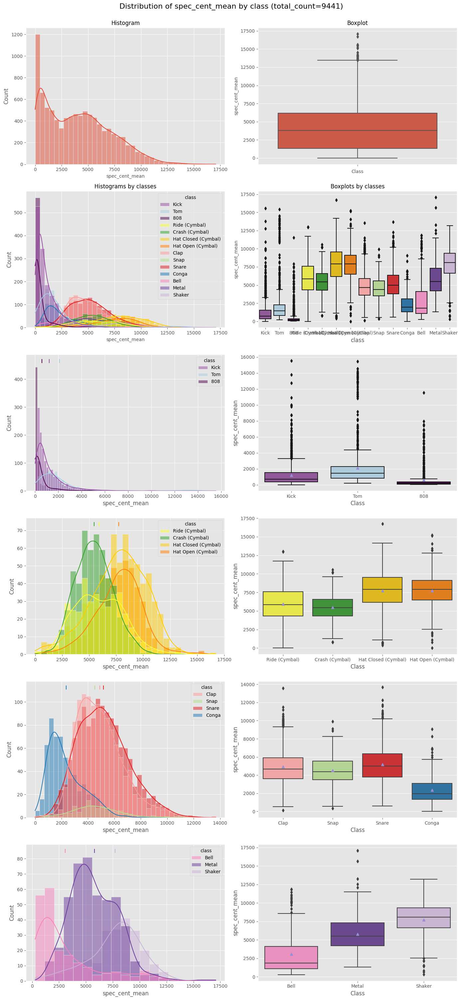

In [ ]:
plot_column_distribution_by_class(df=df_drums, column_focus='spec_cent_mean')

### Spectral bandwidth

100%|██████████| 4/4 [00:01<00:00,  3.42it/s]


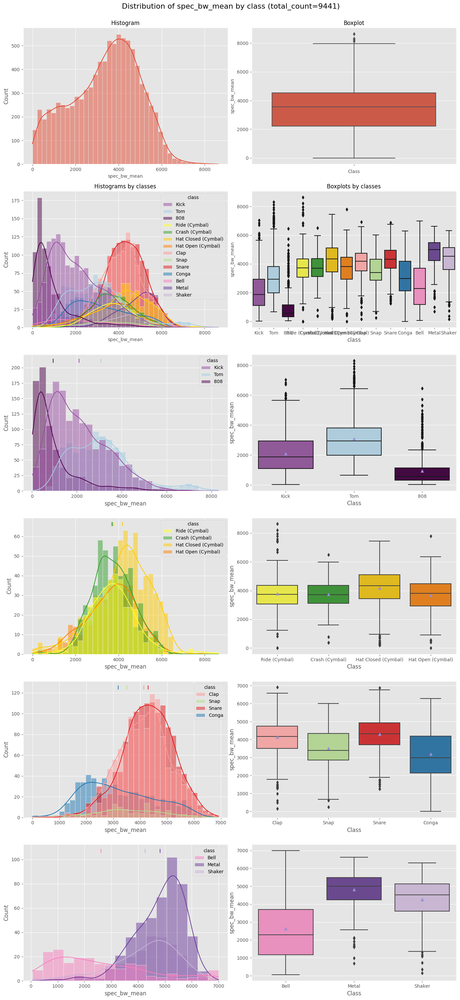

In [ ]:
plot_column_distribution_by_class(df=df_drums, column_focus='spec_bw_mean')

### Spectral rolloff

In [ ]:
plot_column_distribution_by_class(df=df_drums, column_focus='spec_rolloff_mean')

TypeError: ignored

### Spectral contrast

In [ ]:
plot_column_distribution_by_class(df=df_drums, column_focus='spec_contrast_mean')

### MFCC

In [ ]:
plot_column_distribution_by_class(df=df_drums, column_focus='mfcc_mean_1')

In [ ]:
plot_column_distribution_by_class(df=df_drums, column_focus='mfcc_mean_2')

## Normalization

La normalisation des données implique de transformer les données pour qu'elles aient une moyenne nulle et une variance unitaire ou dans une plage spécifique. Cette transformation peut aider à éliminer les biais dans les données et à faciliter la comparaison entre différentes caractéristiques.

Lorsque les données ne sont pas normalisées, il peut être difficile de déterminer si les différences entre les caractéristiques sont dues à des différences réelles entre les données ou simplement à des différences d'échelle. En normalisant les données, on peut s'assurer que les différences observées sont dues à des différences réelles entre les données et non à des différences d'échelle.

Cependant, il est important de noter que la normalisation des données doit être effectuée avec précaution, en fonction du type de données et de l'objectif de l'analyse. Par exemple, pour les données audio, il peut être nécessaire de normaliser les caractéristiques telles que l'amplitude et la fréquence, mais il peut être préférable de ne pas normaliser les caractéristiques liées à la dynamique du son.

In [ ]:
from sklearn.preprocessing import StandardScaler

df_drums_normalized = df_drums.copy()

# normalize features columns
scaler = StandardScaler()
df_drums_normalized[features_columns] = scaler.fit_transform(df_drums_normalized[features_columns])

df_drums_normalized.describe().T

## Bi-variate analysis & Multi-variate analysis

L'analyse bivariée et multivariée vise à explorer les relations et les interactions entre deux ou plusieurs variables ou caractéristiques du jeu de données. L'objectif de cette analyse est de déterminer les corrélations, les associations ou les dépendances entre les variables, qui peuvent être utiles pour la sélection des caractéristiques, la modélisation prédictive et l'interprétation des résultats. Les techniques couramment utilisées pour l'analyse bivariée et multivariée incluent les matrices de corrélation, les cartes de chaleur (heatmaps), les scatterplots et les pairplots. L'analyse bivariée et multivariée fournit des informations approfondies sur la structure des données, aidant à identifier les variables importantes et les modèles sous-jacents.

### Correlation matrix

Cette étape consiste à explorer les relations entre les caractéristiques audio en calculant les corrélations entre elles. Cela permet de mieux comprendre les relations entre les différentes caractéristiques et de détecter les

In [ ]:
correlation_matrix = df_drums[features_columns].corr()
#np.fill_diagonal(correlation_matrix.values, np.nan)

correlation_matrix

In [ ]:
# Use Seaborn's clustermap function to create a heatmap with hierarchical clustering
# save the figure
corr_clustermap_fig = sns.clustermap(correlation_matrix, cmap="coolwarm", annot=True, annot_kws={"size": 6},
                                     figsize=(32, 32))
plt.title("Correlation matrix (Cluster Map)")
corr_clustermap_fig_output_path = os.path.join(PROJECT_PATH, f"corr_clustermap_matrix.png") if SET_UP_GOOGLE_DRIVE else "images/corr_clustermap_matrix.png"
corr_clustermap_fig.savefig(corr_clustermap_fig_output_path, dpi=300, bbox_inches='tight')
print(f"Figure saved to: {corr_clustermap_fig_output_path}")
plt.show()

### Boxplots

In [ ]:
# Taille de chaque chunk

chunk_size = 15

# Générer les chunks
chunks = list(generate_chunks(features_columns, chunk_size))

# Nombre de rows pour les sous-plots
n_rows = len(chunks)

# Créer la figure et les axes des sous-plots
fig, axs = plt.subplots(n_rows, figsize=(15, 8 * n_rows))

# Parcourir les chunks et tracer les boxplots pour chaque chunk
for i, features_columns_chunk in enumerate(chunks):
    # Tracer les boxplots pour le chunk actuel sur l'axe correspondant
    df_drums[features_columns_chunk].boxplot(ax=axs[i])

# Afficher la figure
plt.show()

### Jointplots

In [ ]:
def plot_jointplot(df_drums, x_col, y_col, kind='scatter', color='blue'):
    """
    Create a jointplot using seaborn for the given dataframe and columns.

    Args:
        df_drums (pd.DataFrame): The dataframe containing the data to plot.
        x_col (str): The name of the column to use as the x-axis.
        y_col (str): The name of the column to use as the y-axis.
        kind (str): The type of plot to draw (e.g., 'scatter', 'kde', 'hist', 'hex', 'reg', 'resid').
        color (str): The color of the plot.
        **kwargs: Additional keyword arguments for sns.jointplot.
    """

    sns.jointplot(data=df_drums, x=x_col, y=y_col, kind="hist", color=color, height=6, marginal_ticks=True)
    sns.jointplot(data=df_drums, x=x_col, y=y_col, kind="scatter", color=color, hue="class", height=10, marker=",", s=4,
                  marginal_ticks=True,palette=CLASS_COLORS)

    plt.show()


plot_jointplot(df_drums, x_col='zcr_mean', y_col='spec_cent_mean', color='black')

In [ ]:
plot_jointplot(df_drums, x_col='temp_cent', y_col='spec_cent_mean', color='black')

In [ ]:
plot_jointplot(df_drums, x_col='rms_log_mean', y_col='mfcc_mean_1', color='black')

In [ ]:
plot_jointplot(df_drums, x_col='spec_flatness_mean', y_col='spec_bw_mean', color='black')

In [ ]:
plot_jointplot(df_drums, x_col='mfcc_mean_1', y_col='mfcc_mean_2', color='purple')


### Pairplot

In [ ]:
def plot_pairplot(df, cols, hue_col=None):
    """
    Create a pairplot using seaborn for the given dataframe and columns.

    Args:
        df (pd.DataFrame): The dataframe containing the data to plot.
        cols (list): The list of column names to include in the pairplot.
        hue_col (str, optional): The name of the column to use for hue mapping. Defaults to None.
    """
    g = sns.pairplot(df[cols], corner=True, plot_kws={'marker': ',', 's': 7})
    g.map_upper(sns.regplot, scatter_kws={'marker': ',', 's': 7})
    plt.show()

# Choose a representative subset of features

plot_pairplot(df_drums, cols=['zcr_mean', 'spec_cent_mean', 'mfcc_mean_1', 'mfcc_mean_2', 'rms_log_mean'])


In [ ]:
plot_pairplot(df_drums, cols=get_columns_starts_with(df_drums.columns, "mfcc_mean"))

### Scatter 3D

In [ ]:
def plot_3d_scatter(df, x_col, y_col, z_col, class_names_group=None):
    """
    Create a 3D scatter plot using matplotlib for the given dataframe and columns.

    Args:
        df (pd.DataFrame): The dataframe containing the data to plot.
        x_col (str): The name of the column to use as the x-axis.
        y_col (str): The name of the column to use as the y-axis.
        z_col (str): The name of the column to use as the z-axis.
        hue_col (str, optional): The name of the column to use for hue mapping. Defaults to None.
        class_names_group (List[List[str]], optional): List of lists containing the class names for grouping.
                                                      Defaults to None.
    """
    hue_col = "class"
    if class_names_group is None:
        fig = plt.figure(figsize=(18, 10))
        ax = fig.add_subplot(111, projection='3d')
        group_df = df[df[hue_col].isin(CLASS_COLORS.keys())] if hue_col else df
        for class_name in CLASS_COLORS.keys():
            class_df = group_df[group_df[hue_col] == class_name]
            scatter = ax.scatter(class_df[x_col], class_df[y_col], class_df[z_col], c=CLASS_COLORS[class_name], s=20,
                                 label=class_name)
        ax.set_xlabel(x_col)
        ax.set_ylabel(y_col)
        ax.set_zlabel(z_col)
        ax.legend(title=hue_col)

    else:
        num_groups = len(class_names_group)
        n_cols = 2
        n_rows = int(np.ceil(num_groups / n_cols))
        fig = plt.figure(figsize=(12, n_rows * 5))

        for i, group in enumerate(class_names_group):
            idx_plot = i + 1
            ax = fig.add_subplot(n_rows, n_cols, idx_plot, projection='3d')
            group_df = df[df[hue_col].isin(group)] if hue_col else df
            for class_name in group:
                class_df = group_df[group_df[hue_col] == class_name]
                scatter = ax.scatter(class_df[x_col], class_df[y_col], class_df[z_col], c=CLASS_COLORS[class_name],
                                     s=20,
                                     label=class_name)
            ax.set_xlabel(x_col)
            ax.set_ylabel(y_col)
            ax.set_zlabel(z_col)

            ax.legend(title=hue_col)

        # Adjust subplot spacing
        fig.tight_layout()

    plt.show()


plot_3d_scatter(df_drums, x_col='zcr_mean', y_col='spec_cent_mean', z_col='mfcc_mean_1',
                class_names_group=[['Kick', 'Snare', '808'],
                                   ['Hat Closed (Cymbal)', 'Hat Open (Cymbal)', '808'],
                                   ['Tom', 'Crash (Cymbal)'],
                                   ['Conga', 'Bell', 'Shaker'],
                                   ['Metal', 'Clap'],
                                   ['Ride (Cymbal)', 'Snap'],
                                   ['Kick', 'Hat Closed (Cymbal)', 'Conga'],
                                   ['Snare', 'Hat Open (Cymbal)', 'Bell'],
                                   ['808', 'Crash (Cymbal)'],
                                   ['Kick', 'Ride (Cymbal)', 'Metal'],
                                   ['Snare', 'Snap', 'Clap'],
                                   ['Hat Open (Cymbal)', 'Conga', 'Shaker']]
                )

In [ ]:
plot_3d_scatter(df_drums, x_col='zcr_mean', y_col='spec_cent_mean', z_col='mfcc_mean_1')

In [ ]:
import plotly.graph_objects as go

def plot_3d_scatter_plotly(df, x_col, y_col, z_col, class_names=None):
    """
    Create one 3D scatter plot using Plotly for the given dataframe and columns.

    Args:
        df (pd.DataFrame): The dataframe containing the data to plot.
        x_col (str): The name of the column to use as the x-axis.
        y_col (str): The name of the column to use as the y-axis.
        z_col (str): The name of the column to use as the z-axis.
        class_names (List[str], optional): List containing the class names to add. Defaults to None.
    """
    hue_col = "class"
    
    if class_names is None:
        class_names = df[hue_col].unique()
        
    fig = go.Figure()

    for class_name in class_names:
        class_df = df[df[hue_col] == class_name]
        fig.add_trace(go.Scatter3d(x=class_df[x_col], y=class_df[y_col], z=class_df[z_col],
                                   mode='markers', marker=dict(size=3, color=CLASS_COLORS[class_name]),
                                   name=class_name, text=class_df.file_name))
    fig.update_layout(scene=dict(xaxis_title=x_col, yaxis_title=y_col, zaxis_title=z_col))

    fig.show()

# Example usage
plot_3d_scatter_plotly(df_drums, x_col='zcr_mean', y_col='spec_cent_mean', z_col='mfcc_mean_1')

In [ ]:
plot_3d_scatter_plotly(df_drums, x_col='zcr_mean', y_col='spec_cent_mean', z_col='mfcc_mean_1',
                       class_names=['Kick', 'Snare', '808'])

## Feature Engineering

Le Feature Engineering est une étape clé dans le processus de traitement des données, qui consiste à créer, sélectionner et transformer les variables ou caractéristiques du jeu de données pour améliorer la performance des modèles prédictifs. L'objectif du Feature Engineering est d'extraire des informations significatives à partir des données brutes et de les représenter sous une forme qui peut être facilement interprétée et utilisée par les algorithmes d'apprentissage automatique. Les techniques courantes de Feature Engineering incluent la sélection des caractéristiques basée sur la corrélation ou l'importance, la création de nouvelles caractéristiques à partir des caractéristiques existantes, et la transformation des caractéristiques (mise à l'échelle, normalisation, etc.). Le Feature Engineering peut également impliquer la réduction de la dimensionnalité pour simplifier le modèle et réduire le risque de surapprentissage

### Correlation Analysis
Analyse de la corrélation entre les features et sélection des features pertinentes

In [ ]:
correlation_matrix = df_drums[features_columns].corr()

#### Correlation > 0.8

In [ ]:
threshold_corr = 0.8
abs_correlation_matrix = correlation_matrix.abs()

# Set upper triangle values to NaN
mask = np.triu(np.ones_like(abs_correlation_matrix, dtype=bool))
abs_correlation_matrix.mask(mask, inplace=True)

# keep only the correlation values above the threshold (in absolute value)
abs_correlation_matrix_0_8 = abs_correlation_matrix[abs_correlation_matrix > threshold_corr]

# drop NaN columns and rows
abs_correlation_matrix_0_8 = abs_correlation_matrix_0_8.dropna(axis=0, how='all').dropna(axis=1, how='all')

# transform the correlation matrix into a dataframe (3 columns: feature1, feature2, correlation)
abs_correlation_0_8_df = abs_correlation_matrix_0_8.stack().reset_index()
abs_correlation_0_8_df.columns = ['feature1', 'feature2', 'correlation']
abs_correlation_0_8_df = abs_correlation_0_8_df[
    abs_correlation_0_8_df['feature1'] != abs_correlation_0_8_df['feature2']]
abs_correlation_0_8_df = abs_correlation_0_8_df.sort_values(by='correlation', ascending=False)
abs_correlation_0_8_df

In [ ]:
# search
query_feature = 'rms_log_mean'
abs_correlation_0_8_df.query(f"feature1 == '{query_feature}' or feature2 == '{query_feature}'")

#### Which features are not correlated with other features ?

In [ ]:
# which features are not in the correlation_df ?
features_not_in_corr_df = [feature for feature in features_columns if
                           feature not in abs_correlation_0_8_df['feature1'].values and feature not in
                           abs_correlation_0_8_df['feature2'].values]

print(f"{len(features_not_in_corr_df)} features with no correlation above {threshold_corr} with other features")
print(np.array(features_not_in_corr_df))

#### Which features are correlated with other features ?

In [ ]:
features_in_corr_df = [feature for feature in features_columns if feature not in features_not_in_corr_df]
print(f"{len(features_in_corr_df)} features with at least one correlation above {threshold_corr} with another feature")
print(np.array(features_in_corr_df))

#### Delete too correlated features (keep only one) ?

In [ ]:
table_loser_0_8 = pd.Series(
    abs_correlation_0_8_df["feature1"].to_list() + abs_correlation_0_8_df["feature2"].to_list()).value_counts()
table_loser_0_8

In [ ]:
correlate_features_to_delete = []
for i, row in abs_correlation_0_8_df.iterrows():
    if row["feature1"] in correlate_features_to_delete or row["feature2"] in correlate_features_to_delete:
        continue

    if table_loser_0_8[row["feature2"]] > table_loser_0_8[row["feature1"]]:

        print(
            f"{os.path.basename(row['feature2'])} lose vs. {os.path.basename(row['feature1'])} (because {table_loser_0_8[row['feature2']]} > {table_loser_0_8[row['feature1']]})")
        correlate_features_to_delete.append(row["feature2"])
    else:

        print(
            f"{os.path.basename(row['feature1'])} lose vs. {os.path.basename(row['feature2'])} (because {table_loser_0_8[row['feature1']]} > {table_loser_0_8[row['feature2']]})")
        correlate_features_to_delete.append(row["feature1"])

print(f"> {len(correlate_features_to_delete)} features to delete")
print(np.array(correlate_features_to_delete))

In [ ]:
print(f"{len([col for col in features_columns if col not in correlate_features_to_delete])}/{len(features_columns)} features restantes")

on sauvegarde ça

In [ ]:
if correlate_features_to_delete:
    backup_output_path = os.path.join(SOUNDS_DATASET_PATH, f"__correlate_features_{threshold_corr}_{now_day_str}.csv")
    backup_series = pd.Series(correlate_features_to_delete, name="file_path")
    backup_series.to_csv(backup_output_path, index=False, header=True)
    print(f"Backup saved to {backup_output_path}")

#### Clusters features

In [ ]:
correlation_matrix_without_correlate_features = df_drums[[col for col in features_columns if col not in correlate_features_to_delete]].corr()
correlation_matrix_without_correlate_features

In [ ]:
corr_clustermap_fig = sns.clustermap(correlation_matrix_without_correlate_features, cmap="coolwarm", annot=True,
                                     figsize=(12, 12))
plt.title("Correlation matrix (Cluster Map)")
plt.show()

In [ ]:
import scipy.cluster.hierarchy as sch
from seaborn.matrix import ClusterGrid
from pandas.core.frame import DataFrame

def generate_clusters(corr_clustermap_fig: ClusterGrid, correlation_matrix: DataFrame, num_clusters: int) -> dict:
    """
    Génère les clusters à partir de la figure de clustermap et la matrice de corrélation associée.

    Args:
        num_clusters (int): Nombre de clusters souhaité.
        corr_clustermap_fig (ClusterGrid): Figure de la clustermap générée par Seaborn.
        correlation_matrix (DataFrame): Matrice de corrélation.

    Returns:
        dict: Dictionnaire contenant les clusters comme clés et les colonnes associées comme valeurs.
    """
    row_linkage = corr_clustermap_fig.dendrogram_row.linkage
    col_linkage = corr_clustermap_fig.dendrogram_col.linkage

    row_clusters = sch.fcluster(row_linkage, num_clusters, criterion="maxclust")

    clusters_dict = {i: [] for i in range(1, num_clusters + 1)}

    for cluster_label, column_name in zip(row_clusters, correlation_matrix.columns):
        clusters_dict[cluster_label].append(column_name)

    return clusters_dict


clusters_columns_dict = generate_clusters(corr_clustermap_fig, correlation_matrix_without_correlate_features, num_clusters=2 ** 4)
clusters_columns_dict

Toutes les features restantes n'ont aucune correlation > 0.8 avec un autre features
Après avoir vu ces clusters j'ai envie de  
- regrouper dans une seule features tous les 
    - mfcc_skew_ 3-12
    - garder une seul valeur dans
            ['rms_log_std',
            'spec_cent_std',
            'spec_flatness_mean',
            'spec_flatness_std',
            'spec_rolloff_std'],
- supprimer 
    - mfcc_std_*

In [ ]:
features_to_delete_after_watching_clusters = []

### Feature Selection



In [ ]:
features_columns_selected = [col for col in features_columns if col not in correlate_features_to_delete and col not in features_to_delete_after_watching_clusters]

print(f"{len(features_columns_selected)} features selected")
features_columns_selected

#### Save the dataset with features selected 💾

In [ ]:
df_drums[features_columns_selected].head()

In [ ]:
features_columns_selected + not_features_columns

In [ ]:
output_new_features_path = os.path.join(SOUNDS_DATASET_PATH, f"dataset_features_selected_{now_day_str}.csv")
df_drums[not_features_columns + features_columns_selected ].to_csv(output_new_features_path, index=True)
output_new_features_path

### New features 

Le feature engineering est un processus créatif qui consiste à créer de nouvelles caractéristiques à partir de celles existantes pour améliorer les performances des modèles de machine learning. Voici quelques options et techniques couramment utilisées pour le feature engineering dans le contexte de votre projet :

1. Combinaisons de caractéristiques existantes : Créez de nouvelles caractéristiques en combinant les caractéristiques existantes de manière mathématiquement significative. Par exemple, vous pouvez additionner, soustraire, multiplier ou diviser deux caractéristiques pour créer une nouvelle caractéristique.

2. Statistiques agrégées : Calculez des statistiques agrégées à partir des caractéristiques existantes. Par exemple, vous pouvez calculer la moyenne, la médiane, le minimum, le maximum, la variance ou l'écart-type d'un ensemble de caractéristiques pour créer une nouvelle caractéristique.

3. Transformation des caractéristiques : Appliquez des transformations mathématiques ou statistiques aux caractéristiques existantes pour créer de nouvelles caractéristiques. Par exemple, vous pouvez utiliser des transformations logarithmiques, exponentielles, de puissance, ou des normalisations comme le min-max scaling ou le z-score scaling.

4. Caractéristiques basées sur le temps : Si votre ensemble de données contient des informations temporelles, vous pouvez créer de nouvelles caractéristiques basées sur ces informations. Par exemple, vous pouvez calculer la différence de temps entre deux événements ou extraire des informations saisonnières ou cycliques.

5. Caractéristiques basées sur le domaine : Utilisez votre expertise du domaine pour créer de nouvelles caractéristiques qui capturent des informations pertinentes pour votre problème. Par exemple, dans le contexte de l'audio, vous pouvez extraire des caractéristiques supplémentaires liées au rythme, à la tonalité, à la texture, etc.

En général, un data scientist procède de la manière suivante lorsqu'il s'occupe de la partie feature engineering :

1. Comprendre le problème et les données : Analysez le problème et les données pour identifier les caractéristiques potentiellement importantes et les relations entre elles.

2. Générer des idées de nouvelles caractéristiques : En se basant sur l'analyse des données et l'expertise du domaine, générer des idées de nouvelles caractéristiques qui pourraient être utiles pour améliorer les performances des modèles.

3. Créer et ajouter de nouvelles caractéristiques : Implémenter les idées de nouvelles caractéristiques et les ajouter à l'ensemble de données.

4. Évaluer l'impact des nouvelles caractéristiques : Entraînez des modèles de machine learning avec et sans les nouvelles caractéristiques, et comparez leurs performances pour évaluer l'impact des nouvelles caractéristiques sur la qualité des modèles.

5. Itérer et optimiser : Répétez les étapes 2 à 4 pour générer et évaluer de nouvelles idées de caractéristiques jusqu'à ce que vous atteigniez un niveau satisfaisant de performance des modèles.

### Principal component analysis (PCA)

In [ ]:
df_drums.dropna(axis=0, how='all', subset=features_columns_selected, inplace=True) # todto del cell

#### Dimensionality reduction

In [ ]:
# PCA 3
from sklearn.decomposition import PCA
pca = PCA(n_components=3)

df_drums_features_columns_selected = df_drums[features_columns_selected]

pca.fit(df_drums_features_columns_selected)
df_drums_features_columns_selected_pca3 = pca.transform(df_drums_features_columns_selected)
df_drums_features_columns_selected_pca3 = pd.DataFrame(df_drums_features_columns_selected_pca3, index=df_drums_features_columns_selected.index, columns=['pca_1', 'pca_2', 'pca_3'])
# add class to df
# from dataset get class on file_path
df_drums_features_columns_selected_pca3 = df_drums_features_columns_selected_pca3.merge(df_drums[["class","file_name"]], left_index=True, right_on='file_path')
df_drums_features_columns_selected_pca3

#### Principal component Visualization

In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))
for key, group in df_drums_features_columns_selected_pca3.groupby('class'):
    group.plot(ax=ax, kind='scatter', x='pca_1', y='pca_2', label=key, color=CLASS_COLORS[key])

plt.show()


In [ ]:
fig, ax = plt.subplots(figsize=(20, 10))
for key, group in df_drums_features_columns_selected_pca3.groupby('class'):
    group.plot(ax=ax, kind='scatter', x='pca_1', y='pca_2', label=key, color=CLASS_COLORS[key])

plt.show()

In [ ]:
# plot 3d (color by class)

from mpl_toolkits.mplot3d import Axes3D

fig = plt.figure(figsize=(20, 10))
ax = fig.add_subplot(111, projection='3d')

for key, group in df_drums_features_columns_selected_pca3.groupby('class'):
    ax.scatter(group['pca_1'], group['pca_2'], group['pca_3'], label=key, color=CLASS_COLORS[key])

plt.legend()


In [ ]:
plot_3d_scatter_plotly(df_drums_features_columns_selected_pca3, x_col='pca_1', y_col='pca_2', z_col='pca_3')

In [ ]:
plot_3d_scatter_plotly(df_drums_features_columns_selected_pca3, x_col='pca_1', y_col='pca_2', z_col='pca_3', class_names=['Kick', 'Clap', '808',"Tom","Shaker"])